## Visualization

by Yuqing Wang, Jiaming Lai

In [9]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from pylab import *
import geopandas as gpd
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium import plugins

from wordcloud import WordCloud,STOPWORDS
import plotly.express as px

import warnings 
warnings.filterwarnings("ignore", category=FutureWarning)

In [ ]:
# Create a pandas dataframe of the Airbnb data
data = pd.read_csv('/content/AB_NYC_2019.csv')
data.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [ ]:
# Review the data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [ ]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [ ]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [ ]:
data['reviews_per_month'].fillna(value = 0 , inplace = True)
data.drop(['host_name' ,'last_review'] , axis = 1 , inplace = True)
data.head()

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,0.00,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,0.10,1,0


Group DataFrame by neighbourhood_group

In [ ]:
neighbourhood_group_count = data.groupby('neighbourhood_group').agg('count').reset_index()
neighbourhood_group_count

,neighbourhood_group,id,name,host_id,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Bronx,1091,1090,1091,1091,1091,1091,1091,1091,1091,1091,1091,1091,1091
1,Brooklyn,20104,20098,20104,20104,20104,20104,20104,20104,20104,20104,20104,20104,20104
2,Manhattan,21661,21652,21661,21661,21661,21661,21661,21661,21661,21661,21661,21661,21661
3,Queens,5666,5666,5666,5666,5666,5666,5666,5666,5666,5666,5666,5666,5666
4,Staten Island,373,373,373,373,373,373,373,373,373,373,373,373,373


In [ ]:
plt.style.use('ggplot')

Text(0, 0.5, 'Count')

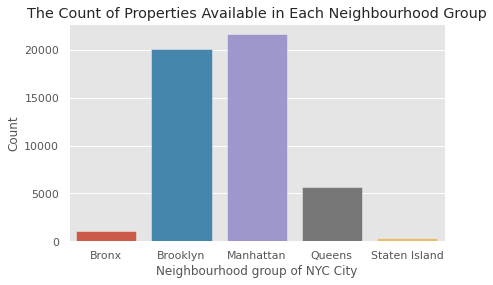

In [ ]:
# The following plot represents the count of Airbnb's in the different neighbourhood groups. 
sns.barplot(x='neighbourhood_group', y ='id', data = neighbourhood_group_count)
plt.title('The Count of Properties Available in Each Neighbourhood Group')
plt.xlabel('Neighbourhood group of NYC City')
plt.ylabel('Count')

Distribution plot  for following numerical categories.For better visualization, we have removed some extreme values.

In [ ]:
def remove_extreme(df,attribute):
  assert isinstance(attribute,str)
  Q1 = df[attribute].quantile(0.25)
  Q3 = df[attribute].quantile(0.75)
  IQR = Q3-Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  df_filtered = df[(df[attribute] > lower_bound) & (df[attribute]< upper_bound)]
  return df_filtered[attribute]

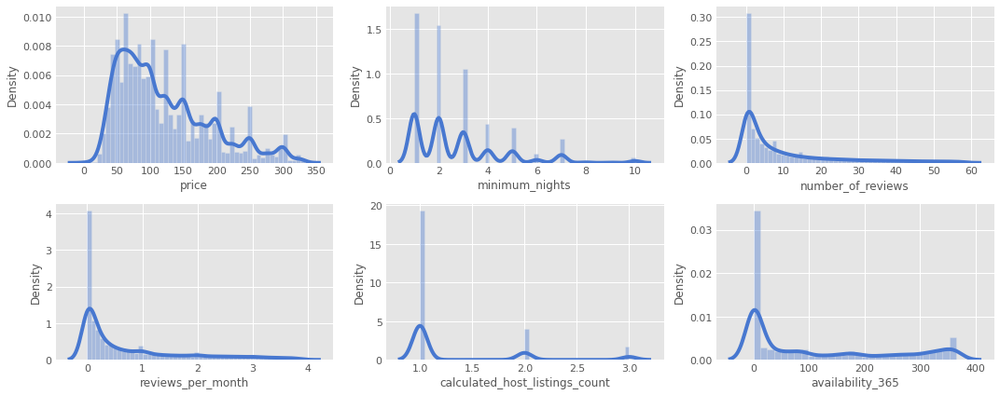

In [ ]:
filtered_price = remove_extreme(data,'price')
filtered_minimum_nights = remove_extreme(data,'minimum_nights')
filtered_number_of_reviews = remove_extreme(data,'number_of_reviews')
filtered_reviews_per_month = remove_extreme(data,'reviews_per_month')
filtered_calculated_host_listings_count = remove_extreme(data,'calculated_host_listings_count')
filtered_availability_365 = remove_extreme(data,'availability_365')

import matplotlib.pyplot as plt
sns.set_palette("muted")
f, ax = plt.subplots(figsize=(15, 6))

subplot(2,3,1)
sns.distplot(filtered_price)

subplot(2,3,2)
sns.distplot(filtered_minimum_nights)

subplot(2,3,3)
sns.distplot(filtered_number_of_reviews)

subplot(2,3,4)
sns.distplot(filtered_reviews_per_month)

subplot(2,3,5)
sns.distplot(filtered_calculated_host_listings_count)

subplot(2,3,6)
sns.distplot(filtered_availability_365)

# automatically adjust subplot parameters to give specified padding
plt.tight_layout() 

**Inference**

All the numerical factors are having right skewed distribution.

Price factor has an unstable distribution.

Both the review factors distribution are similar as they are dependent

Violinplot features a kernel density estimation of the underlying distribution

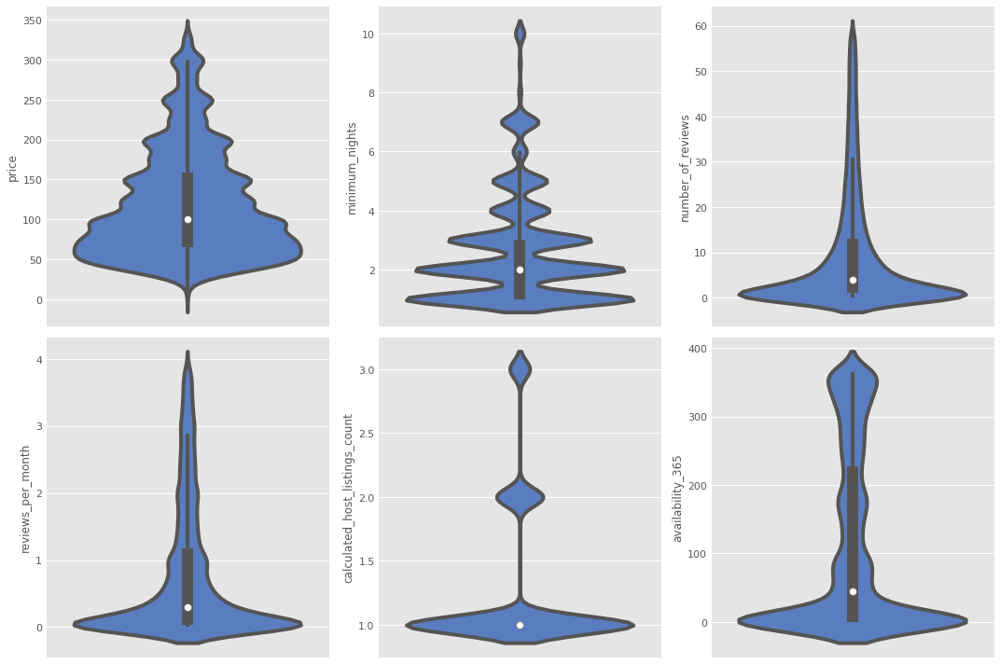

In [ ]:
f, ax = plt.subplots(figsize=(15, 10))
subplot(2,3,1)
sns.violinplot(y = filtered_price) 

subplot(2,3,2)
sns.violinplot(y = filtered_minimum_nights)

subplot(2,3,3)
sns.violinplot(y = filtered_number_of_reviews)

subplot(2,3,4)
sns.violinplot(y = filtered_reviews_per_month )

subplot(2,3,5)
sns.violinplot(y = filtered_calculated_host_listings_count)

subplot(2,3,6)
sns.violinplot(y =filtered_availability_365)

plt.tight_layout() # avoid overlap of plots

# Most features are left-skewed.

Compute pairwise correlation of columns, excluding NA/null values. Display the correlation using the heatmap

Text(0.5, 1.0, 'Correlation matrix of numerical variables')

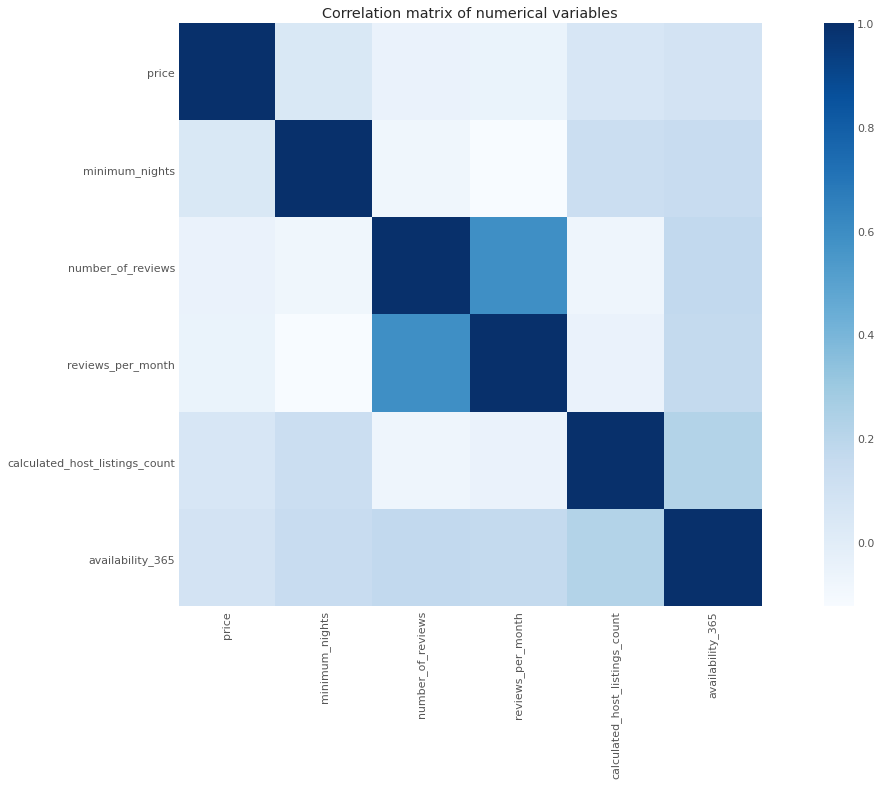

In [ ]:
plt.figure(figsize=(20,10))
sns.heatmap(data.drop(['id','host_id','latitude','longitude'] , axis = 1 ).corr(), square=True, cmap='Blues')
plt.title('Correlation matrix of numerical variables')

**Geographical analysis- Scatter Plot**


Visualise data according to the geographical locations.

Text(0.5, 1.0, 'Availability of Rooms')

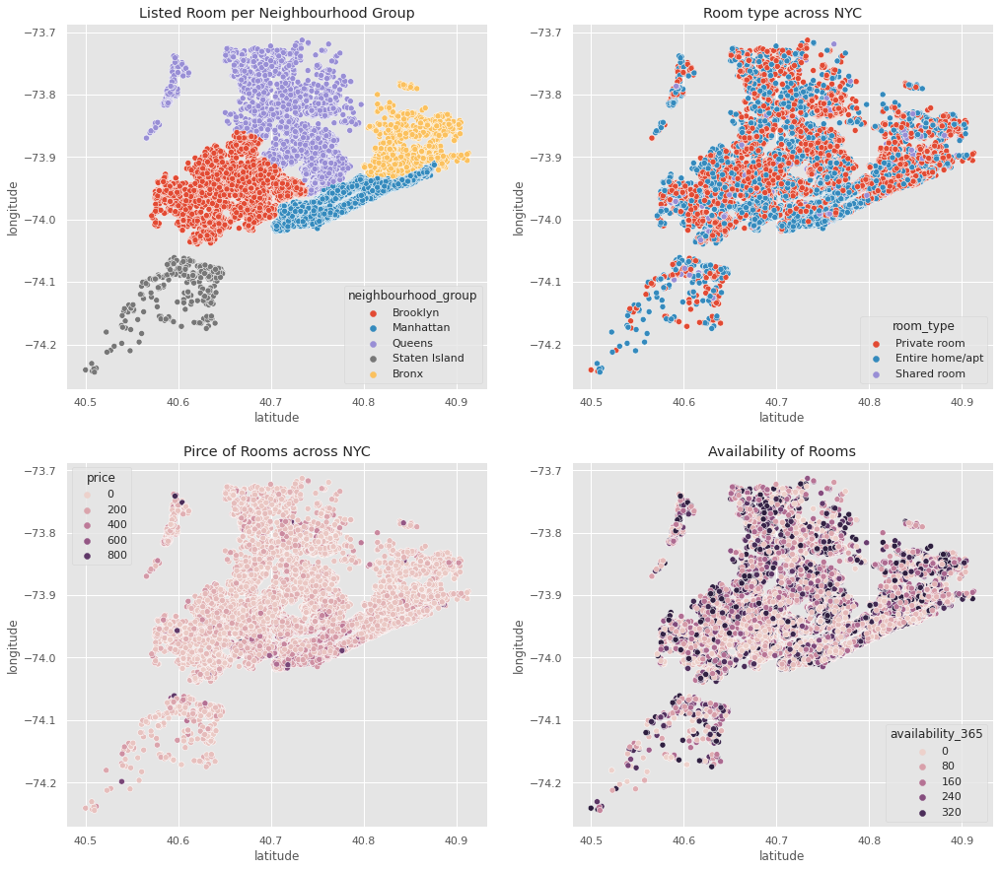

In [ ]:
plt.figure(figsize = (15, 15))
plt.subplot(221)
sns.scatterplot(x="latitude", y="longitude",hue="neighbourhood_group", data=data)
plt.title('Listed Room per Neighbourhood Group')
plt.subplot(222)
sns.scatterplot(x="latitude", y="longitude",hue="room_type", data=data)
plt.title('Room type across NYC')
plt.subplot(223)
sns.scatterplot(x="latitude", y="longitude",hue="price", data= data[ data['price']< 1000])
plt.title('Pirce of Rooms across NYC')
plt.subplot('224')
sns.scatterplot(x="latitude", y="longitude",hue="availability_365", data=data)
plt.title('Availability of Rooms')

**Inference**


From the points on the map we can see that there is more density in the Brooklyn and Manhattan.

Use pie chart and countplot to display the share of each neighborhood group. 

The count plot can be thought of as a histogram across a categorical. 


Manhatten and Brooklyn have the highest share of rooms.

Text(0.5, 1.0, 'Share of Neighborhood Group')

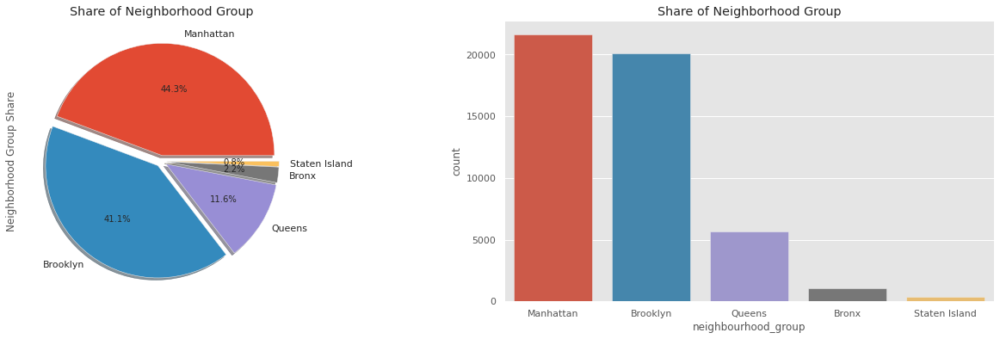

In [ ]:
f,ax = plt.subplots(1,2,figsize=(20,6))
data['neighbourhood_group'].value_counts().plot.pie(explode=[0.05,0.05,0.05,0.05,0.05],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('Share of Neighborhood Group')
ax[0].set_ylabel('Neighborhood Group Share')

sns.countplot('neighbourhood_group',data=data,ax=ax[1],order=data['neighbourhood_group'].value_counts().index)
ax[1].set_title('Share of Neighborhood Group')

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2595: RuntimeWarning:

Mean of empty slice.

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:170: RuntimeWarning:

invalid value encountered in double_scalars



(0.0, 1000.0)

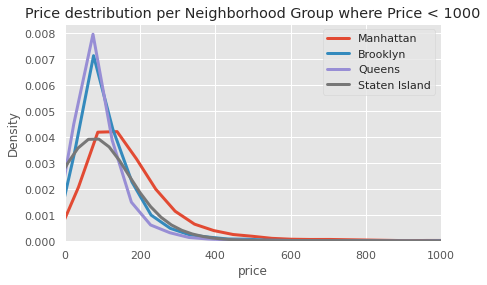

In [ ]:
sns.distplot(data[data.neighbourhood_group=='Manhattan'].price,kde_kws=dict(linewidth=3), hist=False,label='Manhattan')
sns.distplot(data[data.neighbourhood_group=='Brooklyn'].price,kde_kws=dict(linewidth=3),hist=False,label='Brooklyn')
sns.distplot(data[data.neighbourhood_group=='Queens'].price,kde_kws=dict(linewidth=3), hist=False,label='Queens')
sns.distplot(data[data.neighbourhood_group=='Staten Island'].price,kde_kws=dict(linewidth=3), hist=False,label='Staten Island')
sns.distplot(data[data.neighbourhood_group=='Long Island'].price,kde_kws=dict(linewidth=3), hist=False,label='Long Island')
plt.legend()
plt.title('Price destribution per Neighborhood Group where Price < 1000')
plt.xlim(0,1000)

The neighborhood group's price distribution shows that Manhattan has expensive, and Queens has low-priced rooms.

Explore relationship between price and neighbourhood group using boxplot and barplot respectively.

We only consider property whose price is leass than 1000.

Boxplot shows the quartiles of the dataset while the whiskers extend to show the rest of the distribution.

Text(0.5, 1.0, 'Price distribution per Neighbourhood Group')

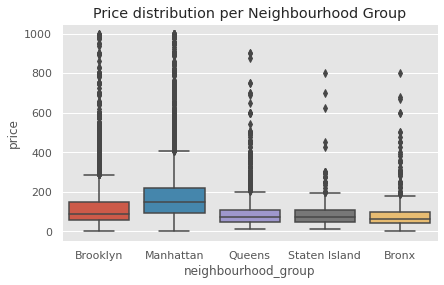

In [ ]:
data1 = data[data['price']<1000]
sns.boxplot(x='neighbourhood_group', y='price', data=data1)
plt.title('Price distribution per Neighbourhood Group')

A bar plot represents an estimate of central tendency for a numeric variable with the height of each rectangle and provides some indication of the uncertainty around that estimate using error bars.

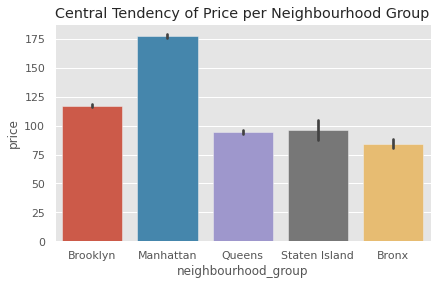

In [ ]:
sns.barplot(x='neighbourhood_group', y="price", data=data1)
plt = title('Central Tendency of Price per Neighbourhood Group')

Each host has a different number of properties listed on the Airbnb website. 

This attribute is called 'calculated_host_listings_count'. 

Here, we are going to analyze this attribute using a pie chart.

Similarly, for presentation, we have removed some extreme values. 

In [ ]:
def remove_extreme(df,attribute):
  assert isinstance(attribute,str)
  lower_bound = df[attribute].quantile(0.01)
  upper_bound = df[attribute].quantile(0.93)
  df_filtered = df[(df[attribute] > lower_bound) & (df[attribute]< upper_bound)]
  return df_filtered[attribute]
filtered_calculated_host_listings_count = remove_extreme(data,'calculated_host_listings_count')

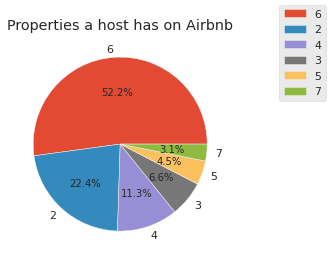

In [ ]:
# Visualizing the percentage of properties most host have
import matplotlib.pyplot as plt
labels = filtered_calculated_host_listings_count.unique()
sizes = filtered_calculated_host_listings_count.value_counts()*100
fig, ax = plt.subplots()
ax.pie(sizes, labels = labels, autopct = '%1.1f%%')
ax.set_title('Properties a host has on Airbnb')
fig.legend(labels=labels)

# Almost half host have six properties listed  on Airbnb
# Then 20% host have two properties listed on Airbnb
# 10% host have four properties listed on Airbnb

Use groupby to group two columns neighbourhood and price, and explore their relationships.

We can see for the top 10 neighbourhoods the mean price is in the range 45 to 57 dollars. Mount Eden,Concord and Grant have higher mean prices. Bulls Head, Hunts Point and Tremont are the neighbourhoods with least price in this case.


Text(0.5, 1.0, 'The Neighborhood with the top 10 mean price')

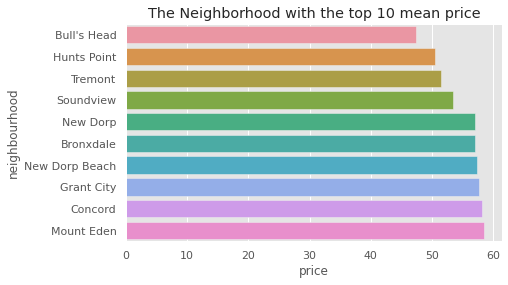

In [ ]:
data_top_prices_by_neighbourhood = data.groupby('neighbourhood').agg({'price': 'mean'}).sort_values('price').reset_index()
sns.barplot(y="neighbourhood", x="price", data=data_top_prices_by_neighbourhood.head(10))
plt.title("The Neighborhood with the top 10 mean price")

The top neighbourhoods are differnt when sorting by mean and maximum Prices. 

Text(0.5, 1.0, 'The Neighborhood with the top 10 max price')

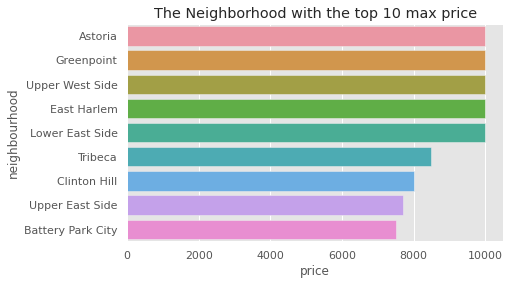

In [ ]:
sns.barplot(y="neighbourhood", x="price", data=data.nlargest(10,['price']))
plt.title("The Neighborhood with the top 10 max price")

Analyze the neighborhood. 

**Inference**: Williamsburg, Bedford-Stuyvesant and Hariem have highest number of rooms.

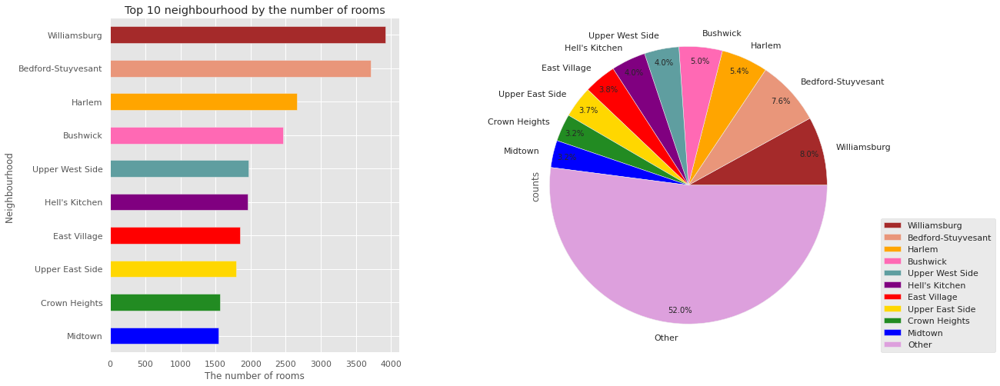

In [ ]:
fig,ax = plt.subplots(1,2,figsize=(15,8))
count = data['neighbourhood'].value_counts()
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
count.sort_values(ascending=False)[:10].sort_values().plot(kind='barh', color=clr,ax=ax[0])
ax[0].set_title("Top 10 neighbourhood by the number of rooms")
ax[0].set_xlabel('The number of rooms')
ax[0].set_ylabel('Neighbourhood ')


groups = list(count.index)[:10]
counts = list(count[:10])
counts.append(count.agg(sum)-count[:10].agg('sum'))
groups.append('Other')
type_dict=pd.DataFrame({"group":groups,"counts":counts})
clr1=('brown','darksalmon','orange','hotpink','cadetblue','purple','red','gold','forestgreen','blue','plum')
qx = type_dict.plot(kind='pie', y='counts', labels=groups,colors=clr1,autopct='%1.1f%%', pctdistance=0.9, radius=1.2,ax=ax[1])
plt.legend(loc=0, bbox_to_anchor=(1.15,0.4)) 
plt.subplots_adjust(wspace =0.5, hspace =0)

**Inference**

Entire home apartment has highest share followed by private room and least prefered is shared room. 

This may because people prefer traveling within a group. 

Very few people opt for shared spaces, probably due to lack of privacy.

People in Staten island seldom book through airbnb

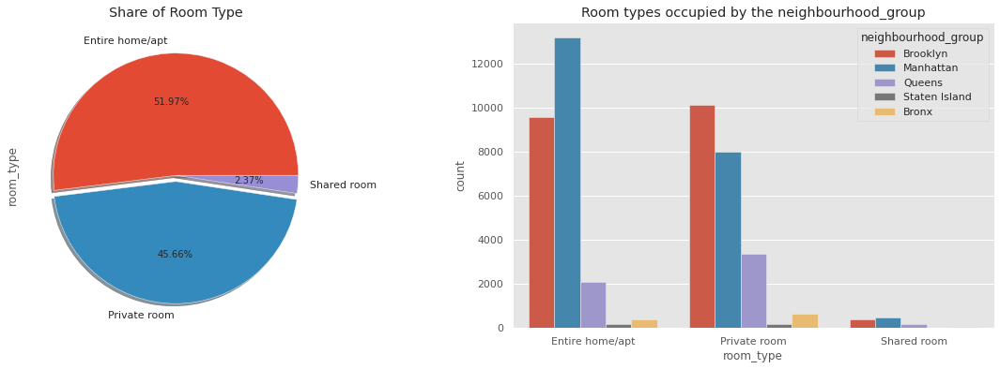

In [ ]:
f,ax = plt.subplots(1,2,figsize=(18,6))
count = data['room_type'].value_counts()
count.plot.pie(explode=[0,0.05,0],autopct='%1.2f%%',ax=ax[0],shadow=True)
ax[0].set_title('Share of Room Type')

sns.countplot(x = 'room_type',hue = "neighbourhood_group", data=data,ax=ax[1],order = count.index)
ax[1].set_title('Room types occupied by the neighbourhood_group')
plt.show()

Count different room types per Neighbourhood Group. 

**Inference**: Manhattan has more apartments and shared rooms. At the same time, Brooklyn has more private spaces.

Text(0.5, 1.0, 'Room types occupied by the neighbourhood_group')

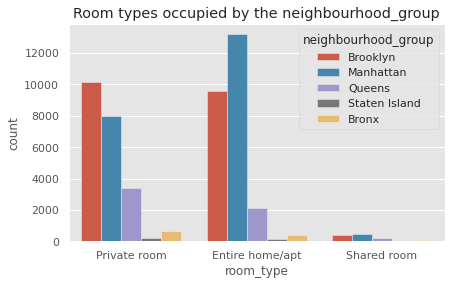

In [ ]:
sns.countplot(x = 'room_type',hue = "neighbourhood_group",data = data)
plt.title("Room types occupied by the neighbourhood_group")

The name of the listed property will influence whether users choose the property or not. 

Next, we will explore the most frequent words that appear in the name of the property. 

**Word Cloud** is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud.

In [ ]:
def make_wordcloud(words):
    text = ""
    for word in words:
        text = text + " " + word

    stopwords = set(STOPWORDS)
    word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap='Pastel1',
                       margin = 0,
                       max_words = 300,  
                       max_font_size = 300, min_font_size = 20,  
                       background_color = "salmon",contour_width = 3).generate(text)
    plt.figure(figsize=(20,20))
    plt.imshow(word_cloud, interpolation="gaussian")
    plt.axis("off")
    plt.show()

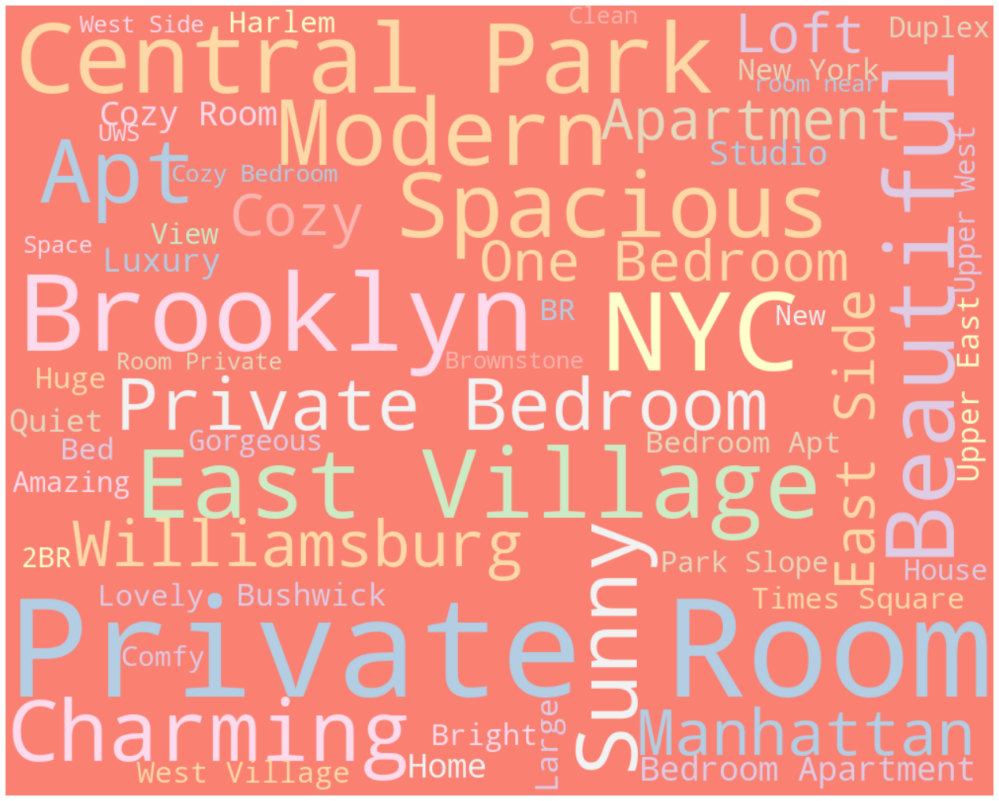

In [ ]:
# Remove missing values in the 'name' attribute
names = data['name'].dropna()
make_wordcloud(names)

Find words appear frequently in the top 1000 luxurious airbnbs.

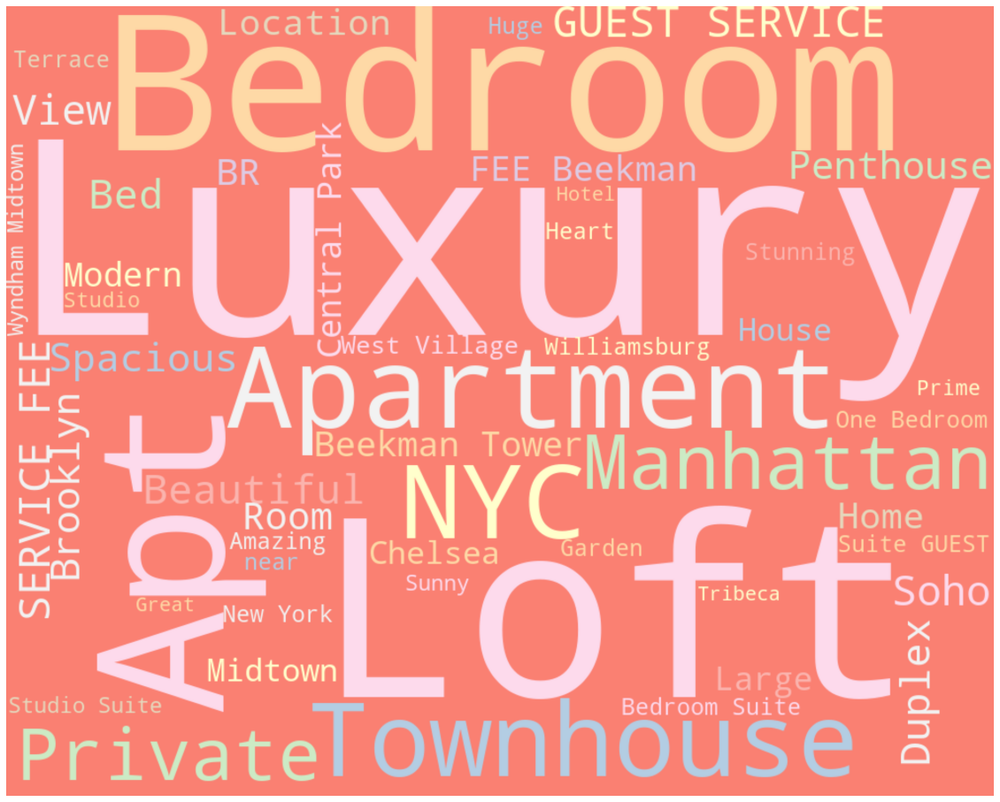

In [ ]:
# Most expensive Airbnbs 
expensive = data.sort_values(by = 'price', ascending = False)

# Storing the names of the 1000 luxurious airbnbs in New York in a separate variable
luxury = expensive.head(1000)

names = luxury['name'].dropna()
make_wordcloud(names)

Use **2D Histogram** to demonstrate the density of the listed properties according to the location (the combination of longitude and latitude). 

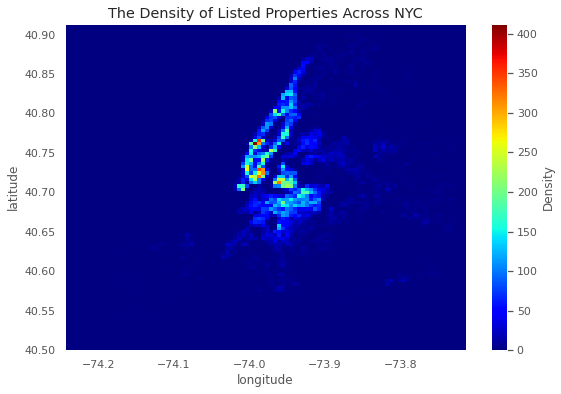

In [ ]:
plt.figure(figsize= (8,6))
plt.hist2d(data.longitude, data.latitude, bins=(100,100),cmap = 'jet')
plt.xlabel("longitude")
plt.ylabel("latitude")
plt.title("The Density of Listed Properties Across NYC")
c_bar = plt.colorbar()
c_bar.set_label('Density')
# It can be seen that some areas in Manhatten are most dense followed by the one's in Brooklyn

The price of each room type per neighborhood group

Text(0.5, 1.0, 'The price of each room type per neighborhood group')

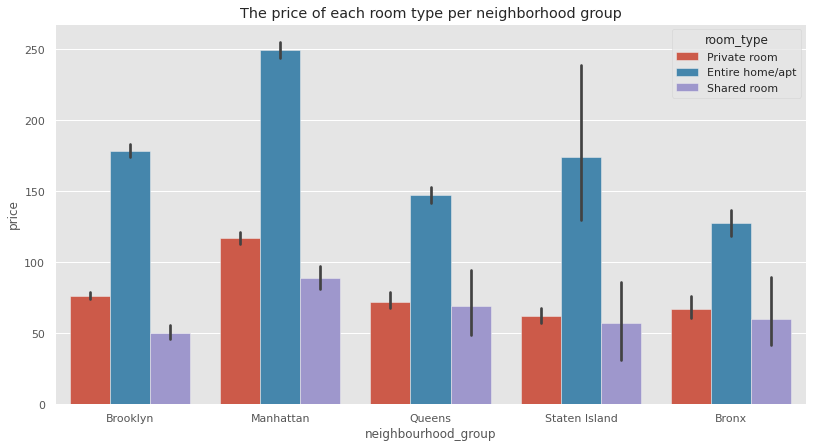

In [ ]:
plt.figure(figsize=(12,7))
sns.barplot(x = "neighbourhood_group", y = "price", hue = "room_type",data = data)
plt.title("The price of each room type per neighborhood group")

Use geopandas to visualize geospatial data better. 

(905464.739038086, 1075092.8783935548, 112485.76063504722, 280480.4142594267)

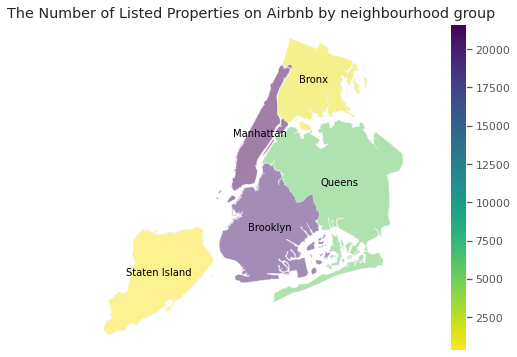

In [ ]:
# Bring in a base layer of NYC boroughs
nyc = gpd.read_file(gpd.datasets.get_path('nybb'))

# Group by neighbourhood group 
neighbourhood_group_count = data.groupby('neighbourhood_group').agg('count').reset_index()

# Rename the column to boroname, so that we can join the data to it on a common field
nyc.rename(columns={'BoroName':'neighbourhood_group'}, inplace=True)
neighbourhood_group_geo = nyc.merge(neighbourhood_group_count, on='neighbourhood_group')

#Plot the count by neighbourhood_group into a map
fig,ax = plt.subplots(1,1, figsize=(10,6))
neighbourhood_group_geo.plot(column='id', cmap='viridis_r', alpha=.5, ax=ax, legend=True)
neighbourhood_group_geo.apply(lambda x: ax.annotate(s=x.neighbourhood_group, color='black', xy=x.geometry.centroid.coords[0],ha='center'), axis=1)
plt.title("The Number of Listed Properties on Airbnb by neighbourhood group ")
plt.axis('off')

The **folium** package makes it easy to visualize data that’s been manipulated in Python on an interactive leaflet map. 

We visualize the listed rooms with the most number of reviews. After clicking on the specific room, the user can see the name of the room

In [ ]:
number_of_reviews_top = data.sort_values(by=['number_of_reviews'],ascending=False).head(1000)
print ("The interactive map showing 1000 listed rooms with the most number of reviews")

NYC_COORDINATES = ( 40.71, -74.00)
# create empty map zoomed in on New York City
map = folium.Map(location=NYC_COORDINATES, zoom_start=12)
tooltip = "Click me!"

# add a marker for every record in the filtered data, use a clustered view
map_rooms_map = plugins.MarkerCluster().add_to(map)

for lat,lon,name in zip(number_of_reviews_top.latitude,number_of_reviews_top.longitude,number_of_reviews_top.name):
    folium.Marker(location=[lat,lon],icon = folium.Icon(icon='home'), popup = name, tooltip=tooltip).add_to(map_rooms_map)
map.add_child(map_rooms_map)

map

Rooms with the most number of reviews


We visualize the listed rooms with the highest price. After clicking on the specific room, the user can see the name of the room.

In [ ]:
price_top = data.sort_values(by=['price'],ascending=False).head(1000)
print ("The interactive map showing 1000 listed rooms with the highest price")

NYC_COORDINATES = ( 40.71, -74.00)
# create empty map zoomed in on New York City
price_map = folium.Map(location=NYC_COORDINATES, zoom_start=12)
tooltip = "Click me!"

# add a marker for every record in the filtered data, use a clustered view
map_price_map = plugins.MarkerCluster().add_to(map)

for lat,lon,name in zip(number_of_reviews_top.latitude,number_of_reviews_top.longitude,number_of_reviews_top.name):
    folium.Marker(location=[lat,lon],icon = folium.Icon(icon='home'), popup = name, tooltip=tooltip).add_to(map_price_map)
    
price_map.add_child(map_price_map)

price_map

The interactive map showing 1000 listed rooms with the highest price


Look at the top 10 hosts in NYC and see where they are hosting in NYC.

Use Plotly's Python graphing library makes interactive graph

In [412]:
# Set the DataFrame
top_10_host = data.host_id.value_counts().reset_index().head(10)
top_10_host.columns = ['host_id', 'count']

# Merge DataFrame  with a database-style join. Similar to a SQL left outer join
top_10_host = top_10_host.merge(data[['host_id','host_name','price', 'latitude','longitude']], left_on = 'host_id',right_on = 'host_id', how = 'left', copy = False)

# Set up a scatter plot on a tile map
fig = px.scatter_mapbox(top_10_host, 
                        lat="latitude", 
                        lon="longitude", 
                        color="host_name", 
                        size="price",
                        color_continuous_scale=px.colors.cyclical.Twilight, 
                        size_max=20, 
                        opacity = .70,
                        zoom=12)
# "open-street-map", "carto-positron", "carto-darkmatter", "stamen-terrain", "stamen-toner" or "stamen-watercolor" 
# yeild maps composed of raster tiles from various public tile servers which do not require signups or access tokens
fig.layout.mapbox.style = 'carto-positron'
fig.update_layout(hovermode='closest',title_text = 'Top 10 hosts and their hosted Locations<br>(Click right legend to toggle hosts)', height = 400)

fig.show()

In [411]:
# Set up a scatter plot on a tile map
fig = px.scatter_mapbox(data, 
                        hover_data = ['price','minimum_nights','room_type','number_of_reviews'],
                        hover_name = 'neighbourhood',
                        lat="latitude", 
                        lon="longitude", 
                        color="neighbourhood_group", 
                        size="price",
                        color_continuous_scale = px.colors.cyclical.Twilight, 
                        size_max = 20, 
                        opacity = .60,
                        zoom=10)
fig.layout.mapbox.style = 'open-street-map'
fig.update_layout(title_text = 'Classify listed rooms by neighborhood group in NYC<br>(Click legend to toggle borough)', height = 400)
fig.show()